<a href="https://colab.research.google.com/github/emirH00/efatur_ml/blob/main/second_try_bettter_fake_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from pydoc import describe

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas import read_csv
from sklearn.linear_model import Ridge


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# prompt: can you read PM_train.csv

import pandas as pd
path = '/content/drive/My Drive/efatur/plane_data/PM_train.csv'
df = pd.read_csv(path)
print(df.head())

   id  cycle  setting1  setting2  setting3      s1      s2       s3       s4  \
0   1      1   -0.0007   -0.0004     100.0  518.67  641.82  1589.70  1400.60   
1   1      2    0.0019   -0.0003     100.0  518.67  642.15  1591.82  1403.14   
2   1      3   -0.0043    0.0003     100.0  518.67  642.35  1587.99  1404.20   
3   1      4    0.0007    0.0000     100.0  518.67  642.35  1582.79  1401.87   
4   1      5   -0.0019   -0.0002     100.0  518.67  642.37  1582.85  1406.22   

      s5  ...     s12      s13      s14     s15   s16  s17   s18    s19  \
0  14.62  ...  521.66  2388.02  8138.62  8.4195  0.03  392  2388  100.0   
1  14.62  ...  522.28  2388.07  8131.49  8.4318  0.03  392  2388  100.0   
2  14.62  ...  522.42  2388.03  8133.23  8.4178  0.03  390  2388  100.0   
3  14.62  ...  522.86  2388.08  8133.83  8.3682  0.03  392  2388  100.0   
4  14.62  ...  522.19  2388.04  8133.80  8.4294  0.03  393  2388  100.0   

     s20      s21  
0  39.06  23.4190  
1  39.00  23.4236  
2  38.95

In [4]:
df.describe()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,2.063100e+04,20631.000000,20631.000000,20631.000000,2.063100e+04,...,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,5.186700e+02,642.680934,1590.523119,1408.933782,1.462000e+01,...,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705
std,29.227633,68.880990,0.002187,0.000293,0.0,6.537152e-11,0.500053,6.131150,9.000605,3.394700e-12,...,0.737553,0.071919,19.076176,0.037505,1.556432e-14,1.548763,0.0,0.0,0.180746,0.108251
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,...,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.325000,1586.260000,1402.360000,1.462000e+01,...,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800
50%,52.000000,104.000000,0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,...,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.555000,1.462000e+01,...,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,...,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 26 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        20631 non-null  int64  
 1   cycle     20631 non-null  int64  
 2   setting1  20631 non-null  float64
 3   setting2  20631 non-null  float64
 4   setting3  20631 non-null  float64
 5   s1        20631 non-null  float64
 6   s2        20631 non-null  float64
 7   s3        20631 non-null  float64
 8   s4        20631 non-null  float64
 9   s5        20631 non-null  float64
 10  s6        20631 non-null  float64
 11  s7        20631 non-null  float64
 12  s8        20631 non-null  float64
 13  s9        20631 non-null  float64
 14  s10       20631 non-null  float64
 15  s11       20631 non-null  float64
 16  s12       20631 non-null  float64
 17  s13       20631 non-null  float64
 18  s14       20631 non-null  float64
 19  s15       20631 non-null  float64
 20  s16       20631 non-null  fl

In [6]:
#Check for missing values
df.isnull().sum()

,0
id,0
cycle,0
setting1,0
setting2,0
setting3,0
s1,0
s2,0
s3,0
s4,0
s5,0


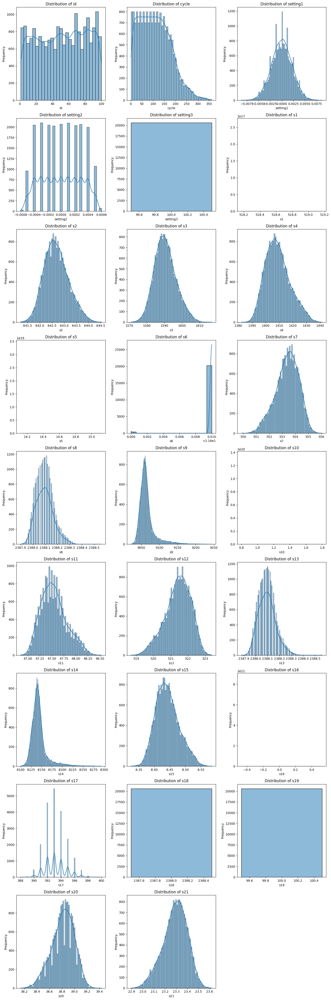

In [7]:
def plotting_all_numerical_features(df):
    numerical_features = df.select_dtypes(include=['float64', 'int64']).columns
    num_features = len(numerical_features)
    rows = (num_features + 2) // 3  # Adjust rows based on the number of features
    fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
    axes = axes.flatten()  # Flatten the axes for easy iteration

    for i, feature in enumerate(numerical_features):
        sns.histplot(df[feature], kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {feature}')
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel('Frequency')

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()
plotting_all_numerical_features(df)

In [8]:
# Function to calculate correlation with a threshold
def correlation(df, threshold):
    corr_matrix = df.corr()
    features = set()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                colname = corr_matrix.columns[i]
                features.add(colname)
    return features

correlation(df, 0.085)  # Select features with correlation above 0.085


{'s11',
 's12',
 's13',
 's14',
 's15',
 's17',
 's2',
 's20',
 's21',
 's3',
 's4',
 's6',
 's7',
 's8',
 's9'}

In [9]:
df.columns

Index(['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
       's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
       's15', 's16', 's17', 's18', 's19', 's20', 's21'],
      dtype='object')

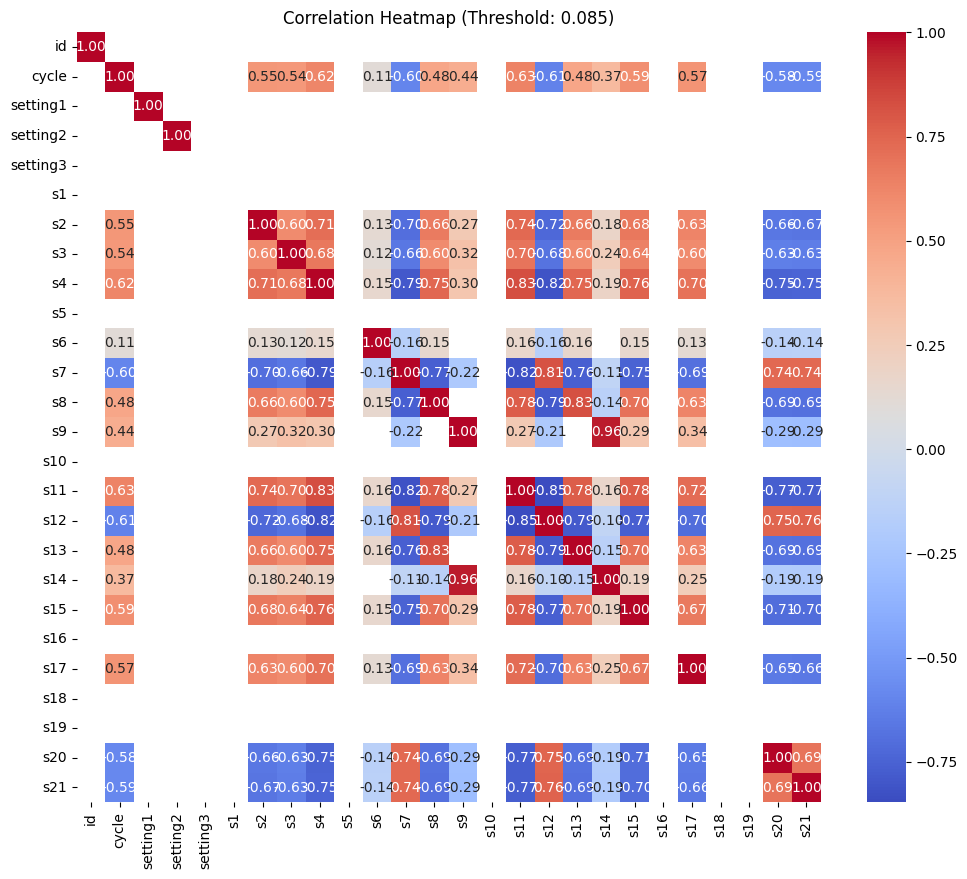

In [10]:
def plot_correlation_heatmap(df, threshold):
    corr_matrix = df.corr()
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", mask=(abs(corr_matrix) < threshold))
    plt.title(f'Correlation Heatmap (Threshold: {threshold})')
    plt.show()

plot_correlation_heatmap(df, 0.085)  # Adjust threshold as needed

In [11]:
#recomended: removing perfectly correlated features
#def remove_perfectly_correlated_features(df, threshold=0.999):

def remove_low_variance_columns_only(df, var_threshold=1e-5):
    # Select numeric columns
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

    # Calculate variance for each numeric column
    variances = df[numeric_cols].var()

    # Find columns to keep (variance above threshold)
    cols_to_keep = variances[variances >= var_threshold].index.tolist()

    # Add non-numeric columns back
    non_numeric_cols = df.select_dtypes(exclude=['float64', 'int64']).columns.tolist()
    all_cols_to_keep = cols_to_keep + non_numeric_cols

    # Return original dataframe with only selected columns
    return df[all_cols_to_keep]

def remove_outliers_only(df, zscore_threshold=3):
    from scipy import stats

    # Select numeric columns for outlier detection
    numeric_df = df.select_dtypes(include=['float64', 'int64'])

    # Fill NaNs with column mean for z-score calculation only
    numeric_filled = numeric_df.fillna(numeric_df.mean())

    # Calculate Z-scores
    z_scores = np.abs(stats.zscore(numeric_filled))

    # Create mask for rows where all z-scores are below threshold
    mask = (z_scores < zscore_threshold).all(axis=1)

    # Return original dataframe filtered by mask (preserves original values)
    return df[mask]

def clean_columns_preserve_data(df, var_threshold=1e-5, zscore_threshold=3, remove_outliers=True):

    print(f"Original shape: {df.shape}")

    # Step 1: Remove low variance columns
    df_cleaned = remove_low_variance_columns_only(df, var_threshold)
    print(f"After removing low-variance columns: {df_cleaned.shape}")

    # Step 2: Remove outliers if requested
    if remove_outliers:
        df_cleaned = remove_outliers_only(df_cleaned, zscore_threshold)
        print(f"After removing outliers: {df_cleaned.shape}")

    return df_cleaned

# Usage - this preserves your original data values
#df_no_outliers = clean_columns_preserve_data(df, remove_outliers=False)  # Only remove columns
# OR
df_no_outliers = clean_columns_preserve_data(df, remove_outliers=True)   # Remove columns and outliers

# Drop specific column
df_no_outliers = df_no_outliers.drop(columns=['s14'], errors='ignore')

Original shape: (20631, 26)
After removing low-variance columns: (20631, 16)
After removing outliers: (19671, 16)


In [12]:
df_no_outliers.describe()

,id,cycle,s2,s3,s4,s7,s8,s9,s11,s12,s13,s15,s17,s20,s21
count,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000
mean,51.619287,103.860404,642.642341,1590.046939,1408.165156,553.435863,2388.092486,9062.765779,47.518674,521.470104,2388.092027,8.439086,393.083626,38.830794,23.298385
std,29.196741,65.549907,0.470910,5.749352,8.358836,0.832649,0.067410,15.805050,0.248440,0.694090,0.068507,0.035071,1.443486,0.169018,0.101471
min,1.000000,1.000000,641.210000,1572.340000,1382.250000,550.730000,2387.900000,9023.850000,46.850000,519.220000,2387.890000,8.330300,389.000000,38.280000,22.965000
25%,26.000000,50.000000,642.310000,1586.040000,1402.100000,552.900000,2388.040000,9052.980000,47.340000,521.030000,2388.040000,8.413900,392.000000,38.720000,23.233600
50%,52.000000,99.000000,642.620000,1589.770000,1407.490000,553.490000,2388.090000,9060.370000,47.500000,521.520000,2388.090000,8.436600,393.000000,38.840000,23.303600
75%,77.000000,149.000000,642.950000,1593.765000,1413.490000,554.040000,2388.140000,9068.390000,47.670000,521.980000,2388.140000,8.461700,394.000000,38.950000,23.370450
max,100.000000,315.000000,644.180000,1608.890000,1435.900000,555.860000,2388.300000,9131.380000,48.340000,523.380000,2388.310000,8.554200,397.000000,39.340000,23.612700


In [13]:
df_no_outliers.describe()

,id,cycle,s2,s3,s4,s7,s8,s9,s11,s12,s13,s15,s17,s20,s21
count,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000,19671.000000
mean,51.619287,103.860404,642.642341,1590.046939,1408.165156,553.435863,2388.092486,9062.765779,47.518674,521.470104,2388.092027,8.439086,393.083626,38.830794,23.298385
std,29.196741,65.549907,0.470910,5.749352,8.358836,0.832649,0.067410,15.805050,0.248440,0.694090,0.068507,0.035071,1.443486,0.169018,0.101471
min,1.000000,1.000000,641.210000,1572.340000,1382.250000,550.730000,2387.900000,9023.850000,46.850000,519.220000,2387.890000,8.330300,389.000000,38.280000,22.965000
25%,26.000000,50.000000,642.310000,1586.040000,1402.100000,552.900000,2388.040000,9052.980000,47.340000,521.030000,2388.040000,8.413900,392.000000,38.720000,23.233600
50%,52.000000,99.000000,642.620000,1589.770000,1407.490000,553.490000,2388.090000,9060.370000,47.500000,521.520000,2388.090000,8.436600,393.000000,38.840000,23.303600
75%,77.000000,149.000000,642.950000,1593.765000,1413.490000,554.040000,2388.140000,9068.390000,47.670000,521.980000,2388.140000,8.461700,394.000000,38.950000,23.370450
max,100.000000,315.000000,644.180000,1608.890000,1435.900000,555.860000,2388.300000,9131.380000,48.340000,523.380000,2388.310000,8.554200,397.000000,39.340000,23.612700


In [14]:
df_no_outliers.head()

,id,cycle,s2,s3,s4,s7,s8,s9,s11,s12,s13,s15,s17,s20,s21
0,1,1,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8.4195,392,39.06,23.4190
1,1,2,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8.4318,392,39.00,23.4236
2,1,3,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8.4178,390,38.95,23.3442
3,1,4,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8.3682,392,38.88,23.3739
4,1,5,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8.4294,393,38.90,23.4044


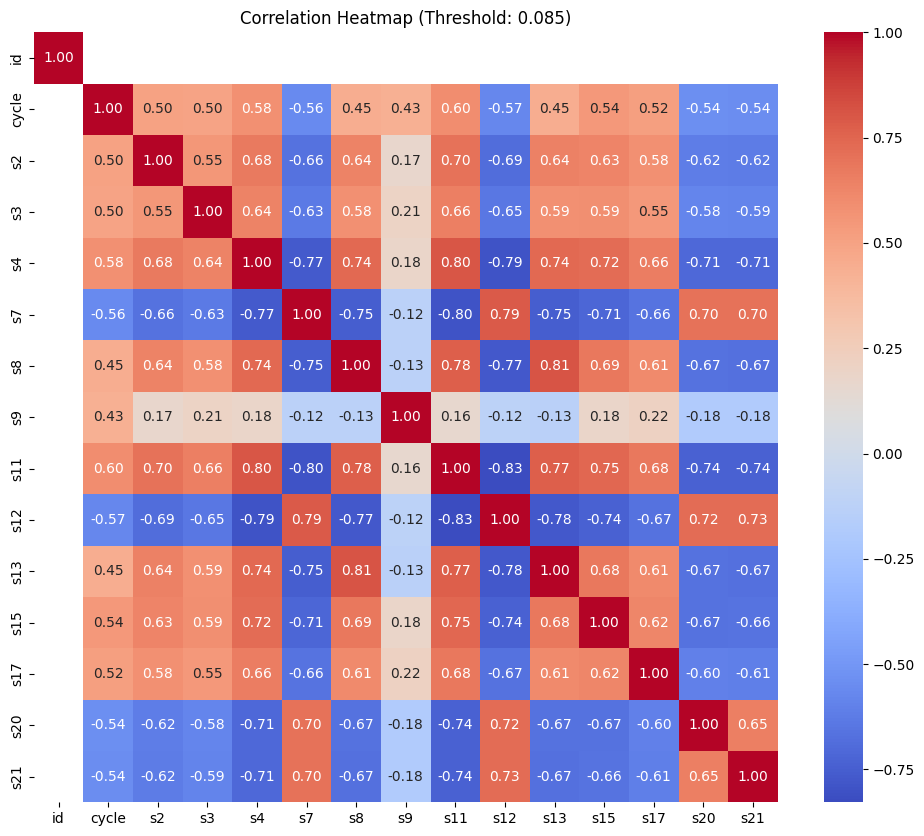

In [15]:
plot_correlation_heatmap(df_no_outliers, 0.085)  # Adjust threshold as needed

In [16]:
print(df_no_outliers["cycle"])

0          1
1          2
2          3
3          4
4          5
        ... 
20623    193
20624    194
20626    196
20627    197
20630    200
Name: cycle, Length: 19671, dtype: int64


In [17]:
#Standardisation of numerical variables:
from sklearn.preprocessing import StandardScaler

cols_not_to_scale = ['id', 'cycle']
cols_to_scale = [col for col in df_no_outliers.columns if col not in cols_not_to_scale]

scaler = StandardScaler()
numeric_cols = df_no_outliers.select_dtypes(include=[np.number]).columns  # Select numeric columns
df_no_outliers[cols_to_scale] = scaler.fit_transform(df_no_outliers[cols_to_scale])# Display the first few rows of the scaled DataFrame
print(df_no_outliers.head())


   id  cycle        s2        s3        s4        s7        s8        s9  \
0   1      1 -1.746324 -0.060345 -0.905072  1.109904 -0.481935 -1.048791   
1   1      2 -1.045535  0.308401 -0.601194  0.377283 -0.778634 -1.182929   
2   1      3 -0.620815 -0.357778 -0.474379  0.989802 -0.185235 -0.621702   
3   1      4 -0.620815 -1.262251 -0.753133  1.217995  0.259814 -0.840625   
4   1      5 -0.578343 -1.251814 -0.232712  0.677538 -0.481935 -0.481870   

        s11       s12       s13       s15       s17       s20       s21  
0 -0.195924  0.273597 -1.051400 -0.558481 -0.750720  1.356142  1.188696  
1 -0.115420  1.166875 -0.321533 -0.207756 -0.750720  1.001140  1.234030  
2 -1.000967  1.368583 -0.905427 -0.606955 -2.136289  0.705305  0.451520  
3 -1.564498  2.002523 -0.175560 -2.021260 -0.750720  0.291137  0.744222  
4 -0.960715  1.037206 -0.759453 -0.276190 -0.057935  0.409471  1.044808  


In [18]:
# this represents life of each aircraft in cycles parameter
# find how many cycles are there for each id
cycle_counts = df['id'].value_counts()
print("Number of cycles for each id:")
print(print(cycle_counts.to_string()))

Number of cycles for each id:
id
69     362
92     341
96     336
67     313
83     293
2      287
64     283
95     283
86     278
17     276
56     275
5      269
84     267
7      259
94     258
54     257
46     256
11     240
81     240
20     234
31     234
59     231
48     231
78     231
25     230
75     229
10     222
89     217
41     216
49     215
47     214
82     214
88     213
51     213
72     213
73     213
52     213
76     210
16     209
71     208
43     207
15     207
97     202
66     202
22     202
9      201
33     200
100    200
79     199
26     199
68     199
50     198
42     196
34     195
18     195
21     195
53     195
30     194
38     194
55     193
1      192
44     192
32     191
4      189
40     188
6      188
85     188
99     185
80     185
61     185
35     181
14     180
62     180
3      179
87     178
63     174
60     172
12     170
37     170
23     168
74     166
28     165
29     163
13     163
19     158
45     158
36     158
27     156

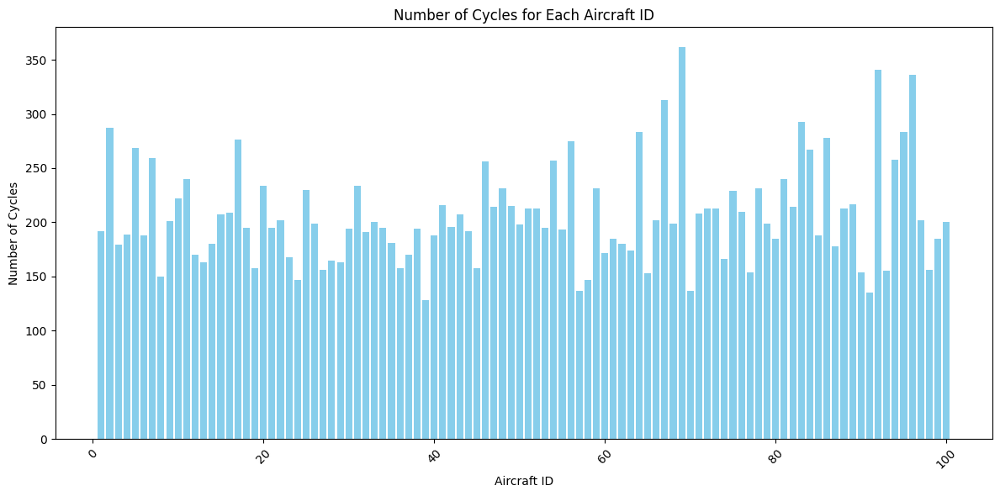

In [19]:
# Plotting the cycle counts
plt.figure(figsize=(12, 6))
plt.bar(cycle_counts.index, cycle_counts.values, color='skyblue')
plt.xlabel('Aircraft ID')
plt.ylabel('Number of Cycles')
plt.title('Number of Cycles for Each Aircraft ID')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [20]:
#  graph all paramter values for a specific id. y axis will be  the cycle number
def plot_parameters_for_id(df, aircraft_id):
    df_id = df[df['id'] == aircraft_id]
    cycles = df_id['cycle']

    plt.figure(figsize=(15, 10))

    for column in df_id.columns:
        if column not in ['id', 'cycle']:
            plt.plot(cycles, df_id[column], label=column)

    plt.xlabel('Cycle Number')
    plt.ylabel('Parameter Values')
    plt.title(f'Parameter Values Over Cycles for Aircraft ID {aircraft_id}')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

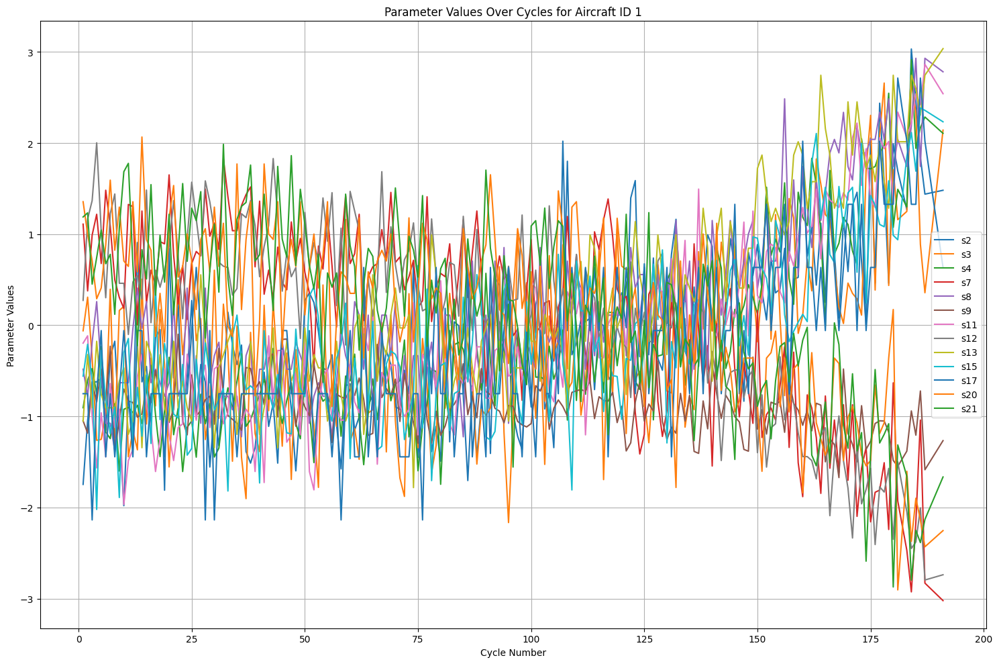

In [21]:
# Example usage for aircraft ID 1
plot_parameters_for_id(df_no_outliers,1)  # Replace 1 with the desired aircraft ID
# Example for aircraft ID 2
#plot_parameters_for_id(df_no_outliers, 2)  # Replace 2 with the desired aircraft ID
# Example for aircraft ID 3
#plot_parameters_for_id(df_no_outliers, 3)  # Replace 3 with the desired aircraft ID


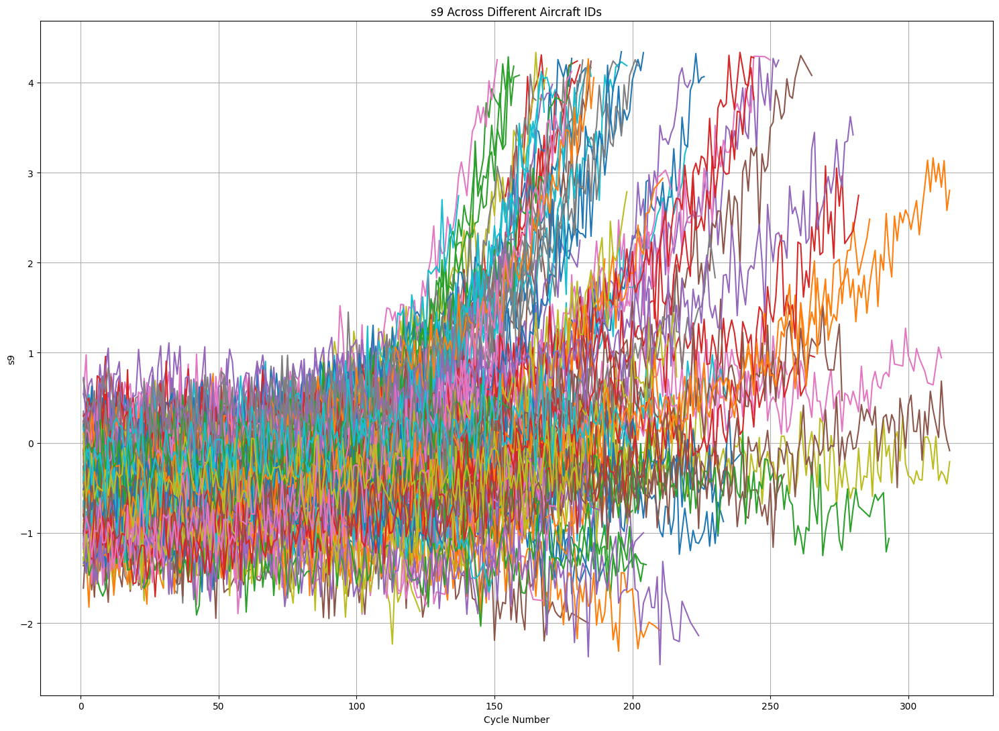

<Figure size 1000x600 with 0 Axes>

In [22]:
# to see a pattern we need to plot one paramter for each id at the same graph
def plot_parameter_across_ids(df, parameter):
    plt.figure(figsize=(15, 11))

    for aircraft_id in df['id'].unique():
        df_id = df[df['id'] == aircraft_id]
        plt.plot(df_id['cycle'], df_id[parameter], label=f'ID {aircraft_id}')

    plt.xlabel('Cycle Number')
    plt.ylabel(parameter)
    plt.title(f'{parameter} Across Different Aircraft IDs')
    plt.grid()
    plt.tight_layout()
    plt.figure(figsize=(10, 6))
    plt.show()

# Example usage for parameter 's1'
#plot_parameter_across_ids(df_no_outliers, 's20')  # Replace 's1' with the desired parameter
# Example usage for parameter 's2'
plot_parameter_across_ids(df_no_outliers, 's9')  # Replace 's2' with the desired parameter

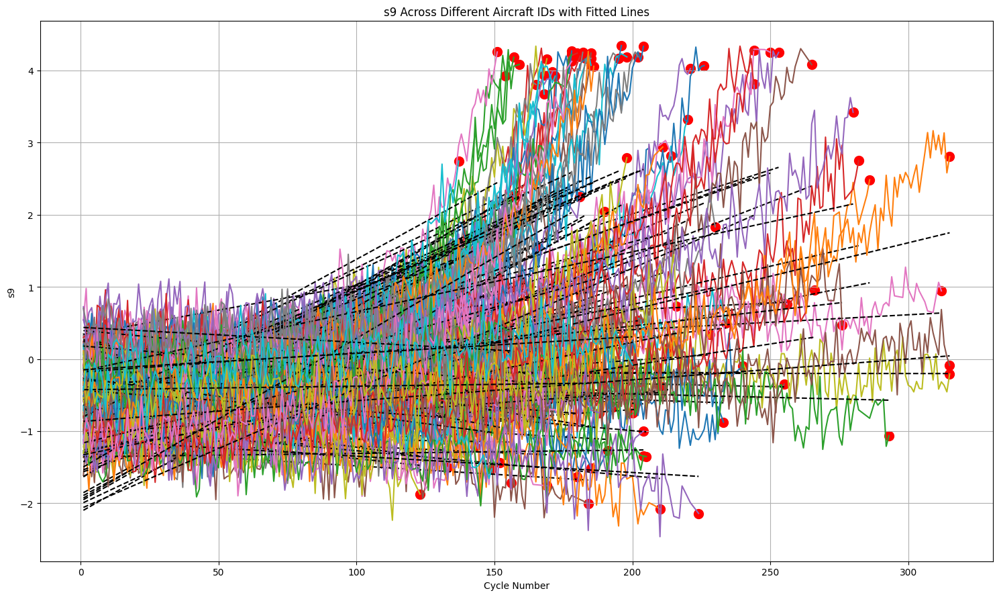

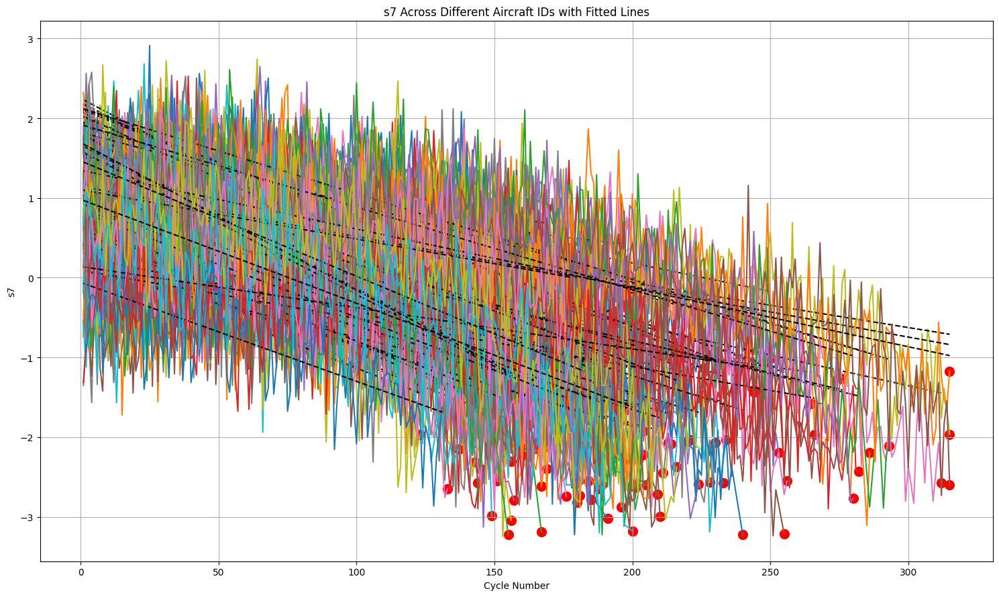

In [23]:
def plot_parameter_with_fit(df, parameter):
    plt.figure(figsize=(15, 9))

    for aircraft_id in df['id'].unique():
        df_id = df[df['id'] == aircraft_id]
        plt.plot(df_id['cycle'], df_id[parameter], label=f'ID {aircraft_id}')

        # Fit a line to the data
        z = np.polyfit(df_id['cycle'], df_id[parameter], 1)  # Linear fit
        p = np.poly1d(z)
        plt.plot(df_id['cycle'], p(df_id['cycle']), linestyle='--', color='black')

        # Add a big dot at the end of each ID's cycle
        plt.scatter(df_id['cycle'].iloc[-1], df_id[parameter].iloc[-1], color='red', s=100, label=f'End of ID {aircraft_id}')

    plt.xlabel('Cycle Number')
    plt.ylabel(parameter)
    plt.title(f'{parameter} Across Different Aircraft IDs with Fitted Lines')
    plt.grid()
    plt.tight_layout()
    plt.show()
# Example usage for parameter 's20'
#plot_parameter_with_fit(df_no_outliers, 's20')  # Replace 's20' with the desired parameter
# Example usage for parameter 's9'
plot_parameter_with_fit(df_no_outliers, 's9')  # Replace 's9' with the desired parameter
#Example usage for parameter 's13'
#plot_parameter_with_fit(df_no_outliers, 's13')  # Replace 's13' with the desired parameter
# Example usage for parameter 's7'
plot_parameter_with_fit(df_no_outliers, 's7')  # Replace 's14' with the desired parameter

In [24]:

#NOT SUİTABLE FOR THE DATASET İT CAN BE USED FOR CLASSİFİCATİON PROBLEMS
"""
#TSNE PREPLEXITY=50
from sklearn.manifold import TSNE
def plot_tsne(df, perplexity=50):
    # Select numeric columns for t-SNE
    numeric_df = df.select_dtypes(include=[np.number])

    # Initialize t-SNE with the specified perplexity
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)

    # Fit and transform the data
    tsne_results = tsne.fit_transform(numeric_df)

    # Create a DataFrame for the t-SNE results
    tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE1', 'TSNE2'])

    # Add the 'id' column for coloring
    tsne_df['id'] = df['id'].values

    # Plot the t-SNE results
    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        data=tsne_df,
        x='TSNE1',
        y='TSNE2',
        hue='id',
        palette='viridis',
        s=100,
        alpha=0.7
    )
    plt.title(f't-SNE Visualization (Perplexity={perplexity})')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.legend(title='Aircraft ID', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Example usage with perplexity=30
plot_tsne(df_no_outliers, perplexity=30)
"""

"\n#TSNE PREPLEXITY=50\nfrom sklearn.manifold import TSNE\ndef plot_tsne(df, perplexity=50):\n    # Select numeric columns for t-SNE\n    numeric_df = df.select_dtypes(include=[np.number])\n\n    # Initialize t-SNE with the specified perplexity\n    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)\n\n    # Fit and transform the data\n    tsne_results = tsne.fit_transform(numeric_df)\n\n    # Create a DataFrame for the t-SNE results\n    tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE1', 'TSNE2'])\n\n    # Add the 'id' column for coloring\n    tsne_df['id'] = df['id'].values\n\n    # Plot the t-SNE results\n    plt.figure(figsize=(12, 8))\n    sns.scatterplot(\n        data=tsne_df,\n        x='TSNE1',\n        y='TSNE2',\n        hue='id',\n        palette='viridis',\n        s=100,\n        alpha=0.7\n    )\n    plt.title(f't-SNE Visualization (Perplexity={perplexity})')\n    plt.xlabel('t-SNE Component 1')\n    plt.ylabel('t-SNE Component 2')\n    plt.lege

In [25]:

# SET UP TRAİNİNG DATA FOR RUL(REMAINİNG USEFUL LIFE)
def prepare_rul_data(df):
    df_copy = df.copy()  # Work on a copy to keep original intact

    print("Find the max cycle count for each unit\n")
    rul = pd.DataFrame(df_copy.groupby('id')['cycle'].max()).reset_index()
    rul.columns = ['id', 'max']  # Keep 'id' as is

    print(rul.head(3))

    # Merge max cycle info back on 'id'
    df_copy = df_copy.merge(rul, on='id', how='left')

    # Calculate RUL
    df_copy['RUL'] = df_copy['max'] - df_copy['cycle']

    # Drop the helper column 'max'
    df_copy.drop(columns=['max'], inplace=True)

    print(df_copy.head(3))
    return df_copy

# Prepare the training data with RUL
df_rul = prepare_rul_data(df_no_outliers)
df_rul.head()

Find the max cycle count for each unit

   id  max
0   1  191
1   2  286
2   3  159
   id  cycle        s2        s3        s4        s7        s8        s9  \
0   1      1 -1.746324 -0.060345 -0.905072  1.109904 -0.481935 -1.048791   
1   1      2 -1.045535  0.308401 -0.601194  0.377283 -0.778634 -1.182929   
2   1      3 -0.620815 -0.357778 -0.474379  0.989802 -0.185235 -0.621702   

        s11       s12       s13       s15       s17       s20       s21  RUL  
0 -0.195924  0.273597 -1.051400 -0.558481 -0.750720  1.356142  1.188696  190  
1 -0.115420  1.166875 -0.321533 -0.207756 -0.750720  1.001140  1.234030  189  
2 -1.000967  1.368583 -0.905427 -0.606955 -2.136289  0.705305  0.451520  188  


,id,cycle,s2,s3,s4,s7,s8,s9,s11,s12,s13,s15,s17,s20,s21,RUL
0,1,1,-1.746324,-0.060345,-0.905072,1.109904,-0.481935,-1.048791,-0.195924,0.273597,-1.051400,-0.558481,-0.750720,1.356142,1.188696,190
1,1,2,-1.045535,0.308401,-0.601194,0.377283,-0.778634,-1.182929,-0.115420,1.166875,-0.321533,-0.207756,-0.750720,1.001140,1.234030,189
2,1,3,-0.620815,-0.357778,-0.474379,0.989802,-0.185235,-0.621702,-1.000967,1.368583,-0.905427,-0.606955,-2.136289,0.705305,0.451520,188
3,1,4,-0.620815,-1.262251,-0.753133,1.217995,0.259814,-0.840625,-1.564498,2.002523,-0.175560,-2.021260,-0.750720,0.291137,0.744222,187
4,1,5,-0.578343,-1.251814,-0.232712,0.677538,-0.481935,-0.481870,-0.960715,1.037206,-0.759453,-0.276190,-0.057935,0.409471,1.044808,186


In [33]:
# prompt: can you read PM_train.csv

import pandas as pd
path = '/content/drive/My Drive/efatur/plane_data/PM_test.csv'
df_test = pd.read_csv(path)
print(df.head())


path = '/content/drive/My Drive/efatur/plane_data/PM_truth.csv'
df_truth = pd.read_csv(path)
print(df_truth.head())

   id  cycle  setting1  setting2  setting3      s1      s2       s3       s4  \
0   1      1   -0.0007   -0.0004     100.0  518.67  641.82  1589.70  1400.60   
1   1      2    0.0019   -0.0003     100.0  518.67  642.15  1591.82  1403.14   
2   1      3   -0.0043    0.0003     100.0  518.67  642.35  1587.99  1404.20   
3   1      4    0.0007    0.0000     100.0  518.67  642.35  1582.79  1401.87   
4   1      5   -0.0019   -0.0002     100.0  518.67  642.37  1582.85  1406.22   

      s5  ...     s12      s13      s14     s15   s16  s17   s18    s19  \
0  14.62  ...  521.66  2388.02  8138.62  8.4195  0.03  392  2388  100.0   
1  14.62  ...  522.28  2388.07  8131.49  8.4318  0.03  392  2388  100.0   
2  14.62  ...  522.42  2388.03  8133.23  8.4178  0.03  390  2388  100.0   
3  14.62  ...  522.86  2388.08  8133.83  8.3682  0.03  392  2388  100.0   
4  14.62  ...  522.19  2388.04  8133.80  8.4294  0.03  393  2388  100.0   

     s20      s21  
0  39.06  23.4190  
1  39.00  23.4236  
2  38.95

In [28]:
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV, KFold

# Use KFold for regression (not StratifiedKFold)
cross_val = KFold(n_splits=5, shuffle=True, random_state=42)

pipe = Pipeline([
    ('pca', PCA()),
    ('regressor', RandomForestRegressor(random_state=42))
])

# Fixed parameter grid - criterion should contain individual strings, not lists
param_grid = {
    'pca__n_components': [5, 8, 10, 12, 13],
    'regressor__n_estimators': [100, 200, 300],
    'regressor__min_samples_leaf': [1, 2, 4, 8],
    'regressor__max_depth': [3, 4, 5, 6, None],  # Added None for unlimited depth
    'regressor__bootstrap': [True, False],
    'regressor__criterion': ['squared_error', 'absolute_error']  # Individual strings, not a list
}

random_search = RandomizedSearchCV(
    pipe,
    param_grid,
    cv=cross_val,  # Use the defined cross_val
    n_iter=5,
    n_jobs=-1,
    scoring='neg_mean_squared_error',
    verbose=True,
    random_state=42
)

# Features (X) - all sensor columns
X = df_rul[['s2', 's3', 's4', 's7', 's8', 's9', 's11', 's12', 's13',
           's15', 's17', 's20', 's21']]

# Target (y) - RUL column
y = df_rul['RUL']

# Fit the model
random_search.fit(X, y)

# Print the best parameters and score
print("Best Parameters:", random_search.best_params_)
print("Best Score (Negative MSE):", random_search.best_score_)
print("Best Estimator:", random_search.best_estimator_)

# Optional: Print cross-validation results
import pandas as pd
results_df = pd.DataFrame(random_search.cv_results_)
print("\nTop 5 parameter combinations:")
print(results_df[['mean_test_score', 'params']].sort_values('mean_test_score', ascending=False).head())

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best Parameters: {'regressor__n_estimators': 200, 'regressor__min_samples_leaf': 8, 'regressor__max_depth': 6, 'regressor__criterion': 'squared_error', 'regressor__bootstrap': False, 'pca__n_components': 13}
Best Score (Negative MSE): -1749.2036320273
Best Estimator: Pipeline(steps=[('pca', PCA(n_components=13)),
                ('regressor',
                 RandomForestRegressor(bootstrap=False, max_depth=6,
                                       min_samples_leaf=8, n_estimators=200,
                                       random_state=42))])

Top 5 parameter combinations:
   mean_test_score                                             params
0     -1749.203632  {'regressor__n_estimators': 200, 'regressor__m...
4     -1782.206869  {'regressor__n_estimators': 100, 'regressor__m...
3     -1906.901179  {'regressor__n_estimators': 100, 'regressor__m...
1     -1906.961808  {'regressor__n_estimators': 300, 'regressor__m...
2     -32

In [35]:
# prompt: prepare test data unite test and truth data then apply same preporcessing functions to data tehn split for testing

def clean_test_data(df, var_threshold=1e-5, zscore_threshold=3, remove_outliers=True, cols_to_keep_from_train=[]):
    print(f"Original test shape: {df.shape}")

    # Step 1: Remove low variance columns based on the training data's columns to keep
    # We need to ensure the test set has the same columns as the training set after cleaning
    if cols_to_keep_from_train:
      df_cleaned = df[cols_to_keep_from_train].copy() # Select only columns present in training
    else:
        # If no training columns are provided, apply the variance removal rule
        numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
        variances = df[numeric_cols].var()
        cols_to_keep = variances[variances >= var_threshold].index.tolist()
        non_numeric_cols = df.select_dtypes(exclude=['float64', 'int64']).columns.tolist()
        all_cols_to_keep = cols_to_keep + non_numeric_cols
        df_cleaned = df[all_cols_to_keep].copy()

    print(f"After removing low-variance columns (based on training set): {df_cleaned.shape}")

    # Step 2: Remove outliers if requested (apply to the test set)
    if remove_outliers:
        df_cleaned = remove_outliers_only(df_cleaned, zscore_threshold)
        print(f"After removing outliers from test set: {df_cleaned.shape}")

    return df_cleaned


# Preprocess the test data using the same cleaning logic applied to the training data
# Get the columns that remained in the training data after cleaning
cols_to_keep_from_train = df_no_outliers.columns.tolist()

df_test_cleaned = clean_test_data(df_test, remove_outliers=True, cols_to_keep_from_train=cols_to_keep_from_train)

# Apply the same scaler fitted on the training data to the test data
cols_not_to_scale_test = ['id', 'cycle'] # Assuming 'id' and 'cycle' exist in test
cols_to_scale_test = [col for col in df_test_cleaned.columns if col not in cols_not_to_scale_test]

# Ensure test set has the same columns to scale as the training set
cols_to_scale_test_present_in_train = [col for col in cols_to_scale_test if col in cols_to_scale]

# Apply the scaler to the intersection of columns
if cols_to_scale_test_present_in_train:
    df_test_cleaned[cols_to_scale_test_present_in_train] = scaler.transform(df_test_cleaned[cols_to_scale_test_present_in_train])
else:
    print("Warning: No columns to scale found in test set that were scaled in training set.")


print("\nCleaned and scaled test data:")
print(df_test_cleaned.head())
print(df_test_cleaned.describe())

# Prepare the truth data - it needs to be formatted to match the test data structure
# The truth data provides the RUL for the *last* cycle of each engine in the test set.
# We need to expand the truth data to have an RUL for *every* cycle in the test set,
# which decreases as the cycle count increases towards the max cycle.

def prepare_test_rul_data(df_test, df_truth):
    df_test_copy = df_test.copy()
    df_truth_copy = df_truth.copy()
    df_truth_copy.columns = ['id', 'truth_rul'] # Rename truth RUL column

    # Merge truth data with test data based on 'id'
    df_test_copy = df_test_copy.merge(df_truth_copy, on='id', how='left')

    # Find the maximum cycle for each engine in the test set
    max_cycles_test = df_test_copy.groupby('id')['cycle'].max().reset_index()
    max_cycles_test.columns = ['id', 'max_cycle_test']

    # Merge max cycle information back into the test data
    df_test_copy = df_test_copy.merge(max_cycles_test, on='id', how='left')

    # Calculate the RUL for each row in the test set
    # The RUL at a given cycle 'c' for an engine is: truth_rul + (max_cycle_test - c)
    df_test_copy['RUL'] = df_test_copy['truth_rul'] + (df_test_copy['max_cycle_test'] - df_test_copy['cycle'])

    # Drop helper columns
    df_test_copy.drop(columns=['truth_rul', 'max_cycle_test'], inplace=True)

    return df_test_copy

df_test_with_rul = prepare_test_rul_data(df_test_cleaned, df_truth)

print("\nTest data with calculated RUL:")
print(df_test_with_rul.head())
print(df_test_with_rul.tail()) # Check tail to see RUL approaching 0

# Split the test data into features (X_test) and target (y_test)
# Use the same features as used for training (excluding 'id' and 'cycle')
X_test = df_test_with_rul[X.columns] # Use the columns from the training features X

# Target (y_test) - the calculated RUL column
y_test = df_test_with_rul['RUL']

print("\nTest Features (X_test):")
print(X_test.head())
print("\nTest Target (y_test):")
print(y_test.head())
print("\nShape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

# Note: For time series data like this, you typically don't shuffle the test set
# as you want to evaluate the model's performance on the data in chronological order.
# The data is already split into train and test files based on engine IDs.

Original test shape: (13096, 26)
After removing low-variance columns (based on training set): (13096, 15)
After removing outliers from test set: (12559, 15)

Cleaned and scaled test data:
   id  cycle        s2        s3        s4        s7        s8        s9  \
0   1      1  0.801998 -0.827408 -1.191004  0.557436 -0.778634 -0.796967   
1   1      2 -1.979920 -0.277767 -1.524791  1.698402 -1.223683 -0.528058   
2   1      3 -0.387219 -0.540412 -0.816541  0.809649 -0.630284 -0.367346   
3   1      4 -0.429691 -1.030914 -0.208785  0.761609 -0.926984 -1.105737   
4   1      5 -0.281039 -0.496928 -0.747151  0.869700 -1.223683 -1.152558   

        s11       s12       s13       s15       s17       s20       s21  
0 -1.282733  0.360043 -0.905427 -0.966234 -0.750720  0.172803  0.740280  
1 -0.075168  0.993983 -0.467507 -1.676238 -0.057935  1.119474  0.918661  
2 -0.075168  0.720236 -0.905427  0.142969 -0.057935  1.474476  1.165043  
3 -0.960715 -0.129820 -0.613480 -1.351176 -1.443504  1.0011


Model Evaluation on Test Set:
Mean Squared Error (MSE): 2385.7045935152164
Root Mean Squared Error (RMSE): 48.843675061518624
R-squared (R2): 0.26726849790328344


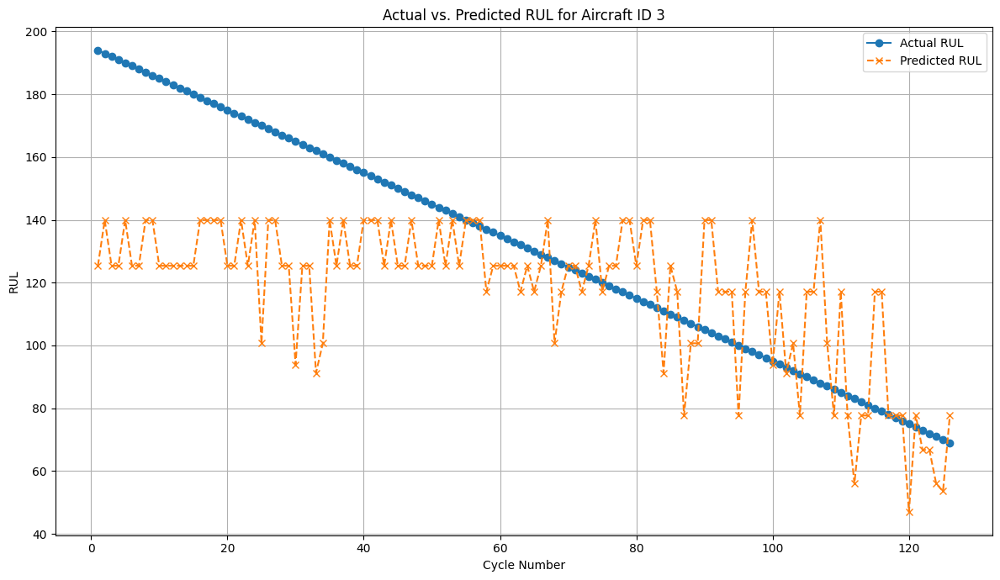

In [38]:
# prompt: now test it and give accuracy

import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

# Get the best model from the randomized search
best_model = random_search.best_estimator_

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse) # Calculate RMSE
r2 = r2_score(y_test, y_pred)

print("\nModel Evaluation on Test Set:")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R2): {r2}")

# Accuracy in RUL prediction is often assessed by metrics like RMSE.
# Lower RMSE indicates better accuracy in predicting the Remaining Useful Life.

# Optional: Plot actual vs. predicted RUL for a specific engine ID
def plot_rul_prediction(df_test_with_rul, y_pred, aircraft_id):
    df_id = df_test_with_rul[df_test_with_rul['id'] == aircraft_id].copy()
    df_id['Predicted_RUL'] = y_pred[df_test_with_rul['id'] == aircraft_id]

    plt.figure(figsize=(12, 7))
    plt.plot(df_id['cycle'], df_id['RUL'], label='Actual RUL', marker='o', linestyle='-')
    plt.plot(df_id['cycle'], df_id['Predicted_RUL'], label='Predicted RUL', marker='x', linestyle='--')

    plt.xlabel('Cycle Number')
    plt.ylabel('RUL')
    plt.title(f'Actual vs. Predicted RUL for Aircraft ID {aircraft_id}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Example usage for aircraft ID 1 in the test set
if 1 in df_test_with_rul['id'].unique():
    plot_rul_prediction(df_test_with_rul, y_pred, 3)
else:
    print("\nAircraft ID 1 not found in the test set for plotting.")

# Example usage for another aircraft ID (choose one present in the test set)
# You can check `df_test_with_rul['id'].unique()` to see available IDs
# plot_rul_prediction(df_test_with_rul, y_pred, 10) # Example for ID 10 if it exists in test


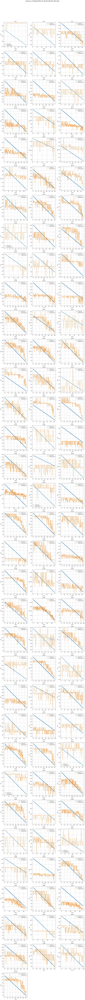

In [40]:
# prompt: can we graph the predicted rul and actual rul  for all planes

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
def plot_all_rul_predictions(df_test_with_rul, y_pred):
    """
    Graphs the predicted RUL and actual RUL for all planes in the test set.

    Args:
        df_test_with_rul (pd.DataFrame): Test DataFrame including 'id', 'cycle', and 'RUL'.
        y_pred (np.ndarray): Array of predicted RUL values, corresponding to rows in df_test_with_rul.
    """
    df_test_with_rul_copy = df_test_with_rul.copy()
    df_test_with_rul_copy['Predicted_RUL'] = y_pred

    unique_ids = df_test_with_rul_copy['id'].unique()
    num_ids = len(unique_ids)

    # Determine grid size for subplots
    cols = 3  # Adjust columns as needed
    rows = (num_ids + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten()

    for i, aircraft_id in enumerate(unique_ids):
        df_id = df_test_with_rul_copy[df_test_with_rul_copy['id'] == aircraft_id]

        axes[i].plot(df_id['cycle'], df_id['RUL'], label='Actual RUL', marker='o', linestyle='-', markersize=3)
        axes[i].plot(df_id['cycle'], df_id['Predicted_RUL'], label='Predicted RUL', marker='x', linestyle='--', markersize=3)

        axes[i].set_title(f'ID {aircraft_id}')
        axes[i].set_xlabel('Cycle')
        axes[i].set_ylabel('RUL')
        axes[i].legend()
        axes[i].grid(True)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.suptitle('Actual vs. Predicted RUL for All Aircraft IDs (Test Set)', y=1.02, fontsize=16)
    plt.show()

# Call the function to plot for all planes
plot_all_rul_predictions(df_test_with_rul, y_pred)


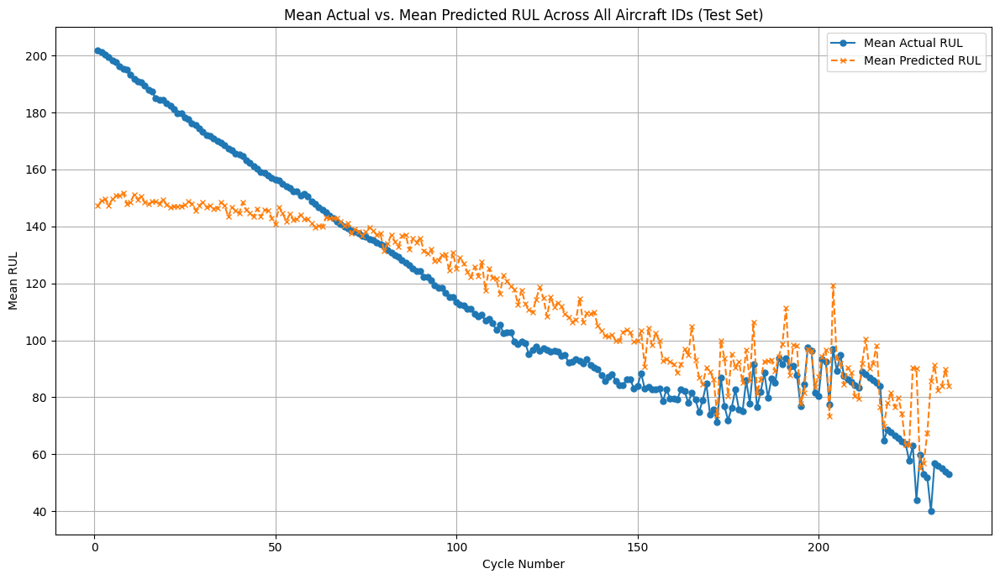

In [43]:
# prompt: can we graph the mean of all predicted rul and actual rul  for all planes at the same graph

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
def plot_mean_rul_prediction(df_test_with_rul, y_pred):
    """
    Graphs the mean predicted RUL and mean actual RUL across all cycles
    and all planes in the test set.

    Args:
        df_test_with_rul (pd.DataFrame): Test DataFrame including 'id', 'cycle', and 'RUL'.
        y_pred (np.ndarray): Array of predicted RUL values, corresponding to rows in df_test_with_rul.
    """
    df_test_with_rul_copy = df_test_with_rul.copy()
    df_test_with_rul_copy['Predicted_RUL'] = y_pred

    # Calculate the mean RUL for each cycle across all aircraft
    mean_actual_rul_per_cycle = df_test_with_rul_copy.groupby('cycle')['RUL'].mean().reset_index()
    mean_predicted_rul_per_cycle = df_test_with_rul_copy.groupby('cycle')['Predicted_RUL'].mean().reset_index()

    plt.figure(figsize=(12, 7))

    plt.plot(mean_actual_rul_per_cycle['cycle'], mean_actual_rul_per_cycle['RUL'],
             label='Mean Actual RUL', marker='o', linestyle='-', markersize=5)
    plt.plot(mean_predicted_rul_per_cycle['cycle'], mean_predicted_rul_per_cycle['Predicted_RUL'],
             label='Mean Predicted RUL', marker='x', linestyle='--', markersize=5)

    plt.xlabel('Cycle Number')
    plt.ylabel('Mean RUL')
    plt.title('Mean Actual vs. Mean Predicted RUL Across All Aircraft IDs (Test Set)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Call the function to plot the mean RUL
plot_mean_rul_prediction(df_test_with_rul, y_pred)
